# **Title: Project2**

---



**Submitted by:** Umais Siddiqui, Banu Boopalan

**Date:** 03/17/25

**Course:** Data Science – DATA620

**Video Link:** https://www.youtube.com/watch?v=Gnn3_Jiuyh0

**Github Repository:https://github.com/BanuB/CUNY-DATA-620-WebAnalytics/blob/main/Project%202/Project2_Final.ipynb

#**Assignment Overview**



**Identify a large 2-node network dataset—you can start with a dataset in a repository.**

Your data should meet the criteria that it consists of ties between and not within two (or more) distinct groups.
Reduce the size of the network using a method such as the island method described in chapter 4 of social network analysis.
What can you infer about each of the distinct groups?

**Amazon Fine Foods dataset**

Source (Citation): J. McAuley and J. Leskovec. From amateurs to connoisseurs: modeling the evolution of user expertise through online reviews. WWW, 2013.
URL: https://snap.stanford.edu/data/web-FineFoods.html

product/productId: asin, e.g. amazon.com/dp/B001E4KFG0
review/userId: id of the user, e.g. A3SGXH7AUHU8GW
review/profileName: name of the user
review/helpfulness: fraction of users who found the review helpful
review/score: rating of the product
review/time: time of the review (unix time)
review/summary: review summary
review/text: text of the review

**ANALYSIS**: 

For this dataset, its a large network dataset, therefore originally it was difficulat to visualize the dataset, so for Exploratory review, we tried to reduce the dataset in stages to see view the dataset. 

Two Distinct Groups: The network should consist of two distinct groups of nodes.

Users: One group of nodes represents users.
Products: The other group of nodes represents products.
Ties Between Groups: The edges should represent interactions between the two groups, not within the same group.

Reviews/Ratings: Edges are score column by users to products.




**BLOCK1: Read the Dataset, change product mapping/user mapping for analysis**

In [1]:
import gzip
import pandas as pd

# Step 1: Read the content of the .txt.gz file
with gzip.open('finefoods.txt.gz', 'rt', encoding='utf-8', errors='ignore') as file:
    content = file.readlines()

# Step 2: Process the content to extract key-value pairs
data = []
current_record = {}
for line in content:
    line = line.strip()
    if line:
        if ': ' in line:
            key, value = line.split(': ', 1)
            current_record[key] = value
    else:
        if current_record:
            data.append(current_record)
            current_record = {}
if current_record:
    data.append(current_record)  # Add the last record if it exists

# Step 3: Create a DataFrame from the processed data
df = pd.DataFrame(data)



In [2]:
# Rename columns
df.rename(columns={
    'product/productId': 'productID',
    'review/userId': 'userID',
    'review/profileName': 'profileName',
    'review/helpfulness': 'helpfulness',
    'review/score': 'score',
    'review/time': 'time',
    'review/summary': 'summary',
    'review/text': 'text'

}, inplace=True)

# Display the DataFrame
print(df.head())
df.columns



    productID          userID                      profileName helpfulness  \
0  B001E4KFG0  A3SGXH7AUHU8GW                       delmartian         1/1   
1  B00813GRG4  A1D87F6ZCVE5NK                           dll pa         0/0   
2  B000LQOCH0   ABXLMWJIXXAIN  Natalia Corres "Natalia Corres"         1/1   
3  B000UA0QIQ  A395BORC6FGVXV                             Karl         3/3   
4  B006K2ZZ7K  A1UQRSCLF8GW1T    Michael D. Bigham "M. Wassir"         0/0   

  score        time                summary  \
0   5.0  1303862400  Good Quality Dog Food   
1   1.0  1346976000      Not as Advertised   
2   4.0  1219017600  "Delight" says it all   
3   2.0  1307923200         Cough Medicine   
4   5.0  1350777600            Great taffy   

                                                text  
0  I have bought several of the Vitality canned d...  
1  Product arrived labeled as Jumbo Salted Peanut...  
2  This is a confection that has been around a fe...  
3  If you are looking for the secr

Index(['productID', 'userID', 'profileName', 'helpfulness', 'score', 'time',
       'summary', 'text'],
      dtype='object')

In [ ]:
# Create unique mappings
user_mapping = {user: f"U{i}" for i, user in enumerate(df['userID'].unique(), start=1)}
product_mapping = {product: f"P{i}" for i, product in enumerate(df['productID'].unique(), start=1)}

df['userID'] = df['userID'].map(user_mapping)
df['productID'] = df['productID'].map(product_mapping)

In [100]:
df.head(20)

,productID,userID,profileName,helpfulness,score,time,summary,text
0,P1,U1,delmartian,1/1,5.0,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,P2,U2,dll pa,0/0,1.0,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,P3,U3,"Natalia Corres ""Natalia Corres""",1/1,4.0,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,P4,U4,Karl,3/3,2.0,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,P5,U5,"Michael D. Bigham ""M. Wassir""",0/0,5.0,1350777600,Great taffy,Great taffy at a great price. There was a wid...
5,P5,U6,Twoapennything,0/0,4.0,1342051200,Nice Taffy,I got a wild hair for taffy and ordered this f...
6,P5,U7,David C. Sullivan,0/0,5.0,1340150400,Great! Just as good as the expensive brands!,This saltwater taffy had great flavors and was...
7,P5,U8,Pamela G. Williams,0/0,5.0,1336003200,"Wonderful, tasty taffy",This taffy is so good. It is very soft and ch...
8,P6,U9,R. James,1/1,5.0,1322006400,Yay Barley,Right now I'm mostly just sprouting this so my...
9,P7,U10,Carol A. Reed,0/0,5.0,1351209600,Healthy Dog Food,This is a very healthy dog food. Good for thei...


**BLOCK2: Create a bipartite graph and prune the grap by threshold weight of 1. User the Score column as the weight for the edge. Beacuse the Nodes were 330317 and Edges were 560804, we tried to prune by taking out low degree nodes less than degree of 5 (number of connections to the node). We got the pruned graph of Pruned Graph - Nodes: 43788, Edges: 211485**

In [ ]:
import networkx as nx

G = nx.Graph()

G.add_nodes_from(df['userID'].unique(), bipartite=0)  # Users
G.add_nodes_from(df['productID'].unique(), bipartite=1)  # Products

edges = list(zip(df['userID'], df['productID'], df['score']))
G.add_weighted_edges_from(edges)

for u, v, d in G.edges(data=True):
    d['weight'] = float(d['weight'])

threshold = 1.0  
G_pruned = nx.Graph()
G_pruned.add_edges_from((u, v, d) for u, v, d in G.edges(data=True) if d['weight'] >= threshold)

for u, v, d in G.edges(data=True):
    if d['weight'] >= threshold:
        G_pruned.add_node(u, bipartite=G.nodes[u]['bipartite'])
        G_pruned.add_node(v, bipartite=G.nodes[v]['bipartite'])

print(f"Pruned Graph - Nodes: {G_pruned.number_of_nodes()}, Edges: {G_pruned.number_of_edges()}")

Pruned Graph - Nodes: 330317, Edges: 560804


In [8]:
degree_threshold = 5
low_degree_nodes = [node for node, degree in dict(G_pruned.degree()).items() if degree < degree_threshold]
G_pruned1 = G_pruned.copy()
G_pruned1.remove_nodes_from(low_degree_nodes)

print(f"Pruned Graph - Nodes: {G_pruned1.number_of_nodes()}, Edges: {G_pruned1.number_of_edges()}")


Pruned Graph - Nodes: 43788, Edges: 211485


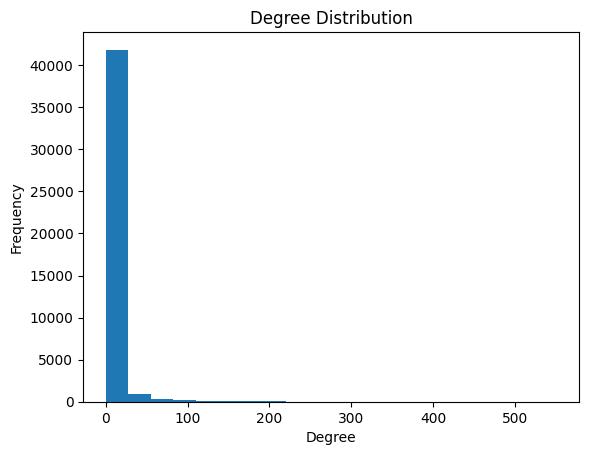

In [ ]:
import matplotlib.pyplot as plt

degrees = [d for n, d in G_pruned1.degree()]
plt.hist(degrees, bins=20)
plt.title("Degree Distribution")
plt.xlabel("Degree")
plt.ylabel("Frequency")
plt.show()

**BLOCK3: Create a user-user projection graph and a product-product projection graph.**

**User-Projection Graph: Analyze users based on shared product ratings.
Product-Projection Graph: Analyze products based on shared user ratings.
When we projected the user-user graph, we can see the Edges climb up exponentially, The number of edges in the user-projection graph can become very large if there are many users who have rated the same products. When we create user-projection graph it creates an edge between every pair of users who have rated at least one common product. If many users rate a lot of common products, then the edge count can climb higher.**


User-User Network - Nodes: 23396, Edges: 2826927
Density: 0.010330, Avg Degree: 241.66
Largest Connected Component - Nodes: 22958, Edges: 2826749


In [ ]:
# Extract the user nodes
users = [n for n, d in G_pruned1.nodes(data=True) if d['bipartite'] == 0]
user_projection = nx.bipartite.weighted_projected_graph(G_pruned1, users)
print(f"User-User Projection - Nodes: {user_projection.number_of_nodes()}, Edges: {user_projection.number_of_edges()}")

User-User Projection - Nodes: 23396, Edges: 2826927


In [ ]:
# Extract the product nodes
products = [n for n, d in G_pruned1.nodes(data=True) if d['bipartite'] == 1]
# Project the bipartite graph onto the product nodes
product_projection = nx.bipartite.weighted_projected_graph(G_pruned1, products)
print(f"Product-Product Projection - Nodes: {product_projection.number_of_nodes()}, Edges: {product_projection.number_of_edges()}")

Product-Product Projection - Nodes: 20392, Edges: 978665


In [ ]:
import networkx as nx
import numpy as np

num_nodes = user_projection.number_of_nodes()
num_edges = user_projection.number_of_edges()
density = nx.density(user_projection)
avg_degree = np.mean([d for n, d in user_projection.degree()])

print(f"User-User Network - Nodes: {num_nodes}, Edges: {num_edges}")
print(f"Density: {density:.6f}, Avg Degree: {avg_degree:.2f}")

largest_cc = max(nx.connected_components(user_projection), key=len)
largest_subgraph = user_projection.subgraph(largest_cc)

print(f"Largest Connected Component - Nodes: {largest_subgraph.number_of_nodes()}, Edges: {largest_subgraph.number_of_edges()}")


User-User Network - Nodes: 23396, Edges: 2826927
Density: 0.010330, Avg Degree: 241.66
Largest Connected Component - Nodes: 22958, Edges: 2826749


**HISTOGRAM OF USER PROJECTION**

The left side of the histogram shows a high frequency of users with low degrees (e.g., 0-500). Most users have co-reviewed products with a relatively small number of other users. These users are likely casual reviewers.
The histogram shows long tail  (e.g., 1000-4000).
Few users with very high degrees, and have co-reviewed products with many other users. These users are likely highly engaged and may act as hubs or influencers within the network.
The presence of users with very high degrees (e.g., 3000-4000) means that there are hubs in the network.These hubs can connect different parts of the network of users or products.

Example: User U368: 4019 co-reviews

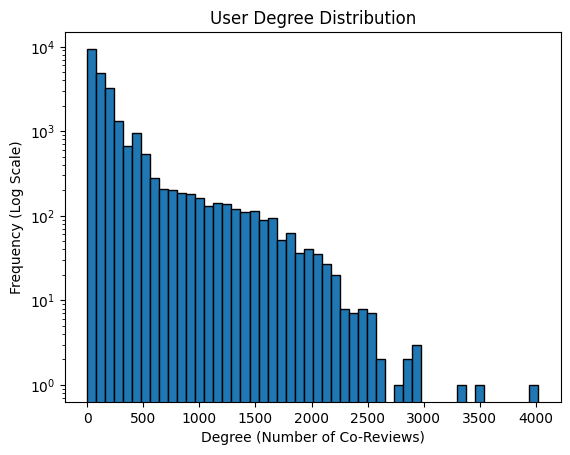

In [13]:
import matplotlib.pyplot as plt

degree_sequence = [d for n, d in user_projection.degree()]
plt.hist(degree_sequence, bins=50, log=True, edgecolor='black')
plt.xlabel("Degree (Number of Co-Reviews)")
plt.ylabel("Frequency (Log Scale)")
plt.title("User Degree Distribution")
plt.show()


**BLOCK4: product_projection.degree()**

This retrieves the degree (number of co-reviews) for each product in the product-product projection. 
Just like in the user-user case, the degree distribution shows how many products have a particular number of co-reviews with other products.
Log scale scale for the frequency axis helps visualize highly skewed distributions, especially when most products have fewer co-reviews compared to a few products with a very high number of co-reviews.



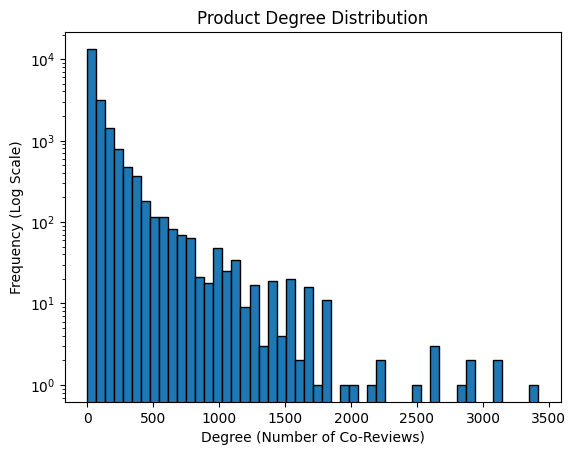

In [14]:
import matplotlib.pyplot as plt

degree_sequence = [d for n, d in product_projection.degree()]
plt.hist(degree_sequence, bins=50, log=True, edgecolor='black')
plt.xlabel("Degree (Number of Co-Reviews)")
plt.ylabel("Frequency (Log Scale)")
plt.title("Product Degree Distribution")
plt.show()


In [15]:
top_users = sorted(user_projection.degree(), key=lambda x: x[1], reverse=True)[:10]
print("Top 10 Users by Degree (Most Co-Reviews):")
for user, degree in top_users:
    print(f"User {user}: {degree} co-reviews")


Top 10 Users by Degree (Most Co-Reviews):
User U368: 4019 co-reviews
User U7959: 3523 co-reviews
User U46: 3362 co-reviews
User U3139: 2963 co-reviews
User U6503: 2958 co-reviews
User U1042: 2943 co-reviews
User U4398: 2878 co-reviews
User U461: 2871 co-reviews
User U6150: 2734 co-reviews
User U5152: 2584 co-reviews


**Community Detection:The highly connected users may show communities or clusters within the network. These communities can be further analyzed to understand the relationships and interactions between users.Using the community.best_partition there were 442 user communities detected.**

In [ ]:
import community  

partition = community.best_partition(user_projection)
num_communities = len(set(partition.values()))

print(f"Detected {num_communities} user communities")


Detected 442 user communities


**Key Observations Central Dense Cluster:**

There is a dense cluster of nodes in the center of the graph.
This cluster represents a group of users who have many co-reviews with each other, indicating high connectivity and engagement within this group.
There are many nodes scattered around the periphery of the graph with few or no connections.
Due to the large size , we decided to sample 5000 users and then calculate top 10 centrality measures
Degree Centrality (0.164833): User U368 has a direct connections with other users, has active participation and shared interests with a significant number of users.
Betweenness Centrality (0.107619): User U368 plays an important role as a bridge in the network, connecting different user groups.
Closeness Centrality (0.461310): User U368 can efficiently reach other users in the network, making them well-positioned to spread information or influence others quickly.

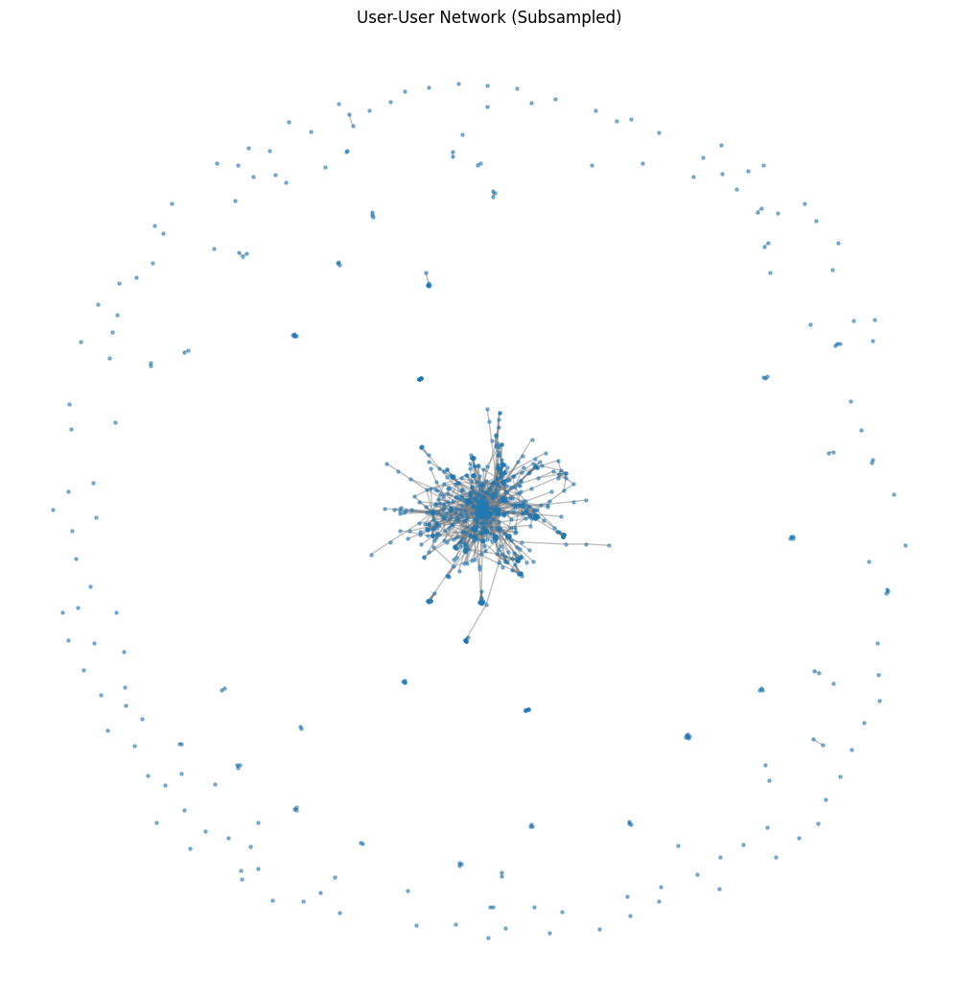

In [18]:
import random

subgraph_nodes = random.sample(list(user_projection.nodes()), 1000)  # Sample 1000 users
subgraph = user_projection.subgraph(subgraph_nodes)

plt.figure(figsize=(10, 10))
nx.draw(subgraph, node_size=5, edge_color="gray", alpha=0.5)
plt.title("User-User Network (Subsampled)")
plt.show()


In [ ]:
import random

# Sample 5000 users randomly
sample_size = 5000
sample_users = random.sample(list(user_projection.nodes()), sample_size)
user_subgraph = user_projection.subgraph(sample_users).copy()
print(f"Sampled Graph - Nodes: {user_subgraph.number_of_nodes()}, Edges: {user_subgraph.number_of_edges()}")


Sampled Graph - Nodes: 5000, Edges: 133849


In [ ]:
degree_centrality = nx.degree_centrality(user_subgraph)  # Replace with chosen subgraph
betweenness_centrality = nx.betweenness_centrality(user_subgraph, k=200)  # Approximate betweenness
closeness_centrality = nx.closeness_centrality(user_subgraph)
eigenvector_centrality = nx.eigenvector_centrality(user_subgraph, max_iter=300)
pagerank = nx.pagerank(user_subgraph)

df_centrality = pd.DataFrame({
    "User": list(degree_centrality.keys()),
    "Degree Centrality": list(degree_centrality.values()),
    "Betweenness Centrality": list(betweenness_centrality.values()),
    "Closeness Centrality": list(closeness_centrality.values()),
    "Eigenvector Centrality": list(eigenvector_centrality.values()),
    "PageRank": list(pagerank.values())
}).sort_values(by="Degree Centrality", ascending=False).head(10)

print(df_centrality)


        User  Degree Centrality  Betweenness Centrality  Closeness Centrality  \
2683   U7959           0.151830                0.051119              0.446330   
2400     U46           0.145829                0.049321              0.451769   
3608   U6150           0.121424                0.035350              0.434729   
721    U6436           0.112222                0.006950              0.434644   
4454  U10297           0.111222                0.005232              0.434475   
119      U15           0.104621                0.032011              0.437767   
3290   U9827           0.104421                0.020100              0.436735   
567    U2793           0.104021                0.012241              0.436649   
1348    U480           0.104021                0.010330              0.424687   
1238   U6444           0.099820                0.008606              0.432322   

      Eigenvector Centrality  PageRank  
2683                0.062605  0.002361  
2400                0.0728

**This degree centrality below will show you which products are the most central in the network, meaning they have the most co-reviews with other products.For instance, 'P7943' is a Coffee product based on the comments in the review summary column, therefore there are many rows on this dataset for this product with multiple users interacting with it.**

In [ ]:
degree_centrality = nx.degree_centrality(product_projection)
sorted_centrality = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)
top_10_centrality = sorted_centrality[:10]
print("Top 10 products by degree centrality:")
for product, centrality in top_10_centrality:
    print(f"Product: {product}, Degree Centrality: {centrality}")


Top 10 products by degree centrality:
Product: P7943, Degree Centrality: 0.1676229709185425
Product: P51653, Degree Centrality: 0.1518807316953558
Product: P5675, Degree Centrality: 0.15094894806532294
Product: P11273, Degree Centrality: 0.14349467902506008
Product: P71131, Degree Centrality: 0.14285714285714285
Product: P30751, Degree Centrality: 0.13952233828649896
Product: P37812, Degree Centrality: 0.13044970820460006
Product: P59009, Degree Centrality: 0.13044970820460006
Product: P64911, Degree Centrality: 0.13044970820460006
Product: P36781, Degree Centrality: 0.12093570692952774


**This community method on the  graph is broken into separate subgraphs, where each component represents a group of products that are strongly connected.**

C:\Users\Banu\AppData\Local\Temp\ipykernel_27508\959041477.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map = {community: plt.cm.get_cmap("tab10")(i % 10) for i, community in enumerate(top_communities)}


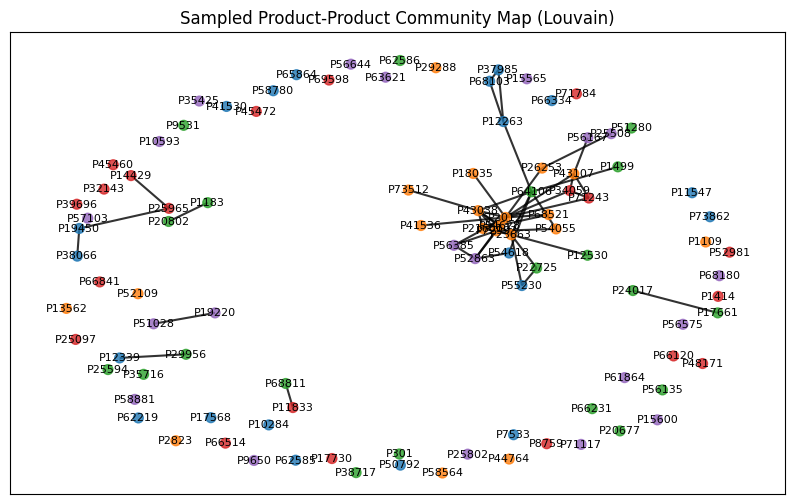

In [ ]:

partition = community_louvain.best_partition(product_projection)
# Get a subset of communities (e.g., first 5 largest)
community_sizes = {}
for product, community in partition.items():
    community_sizes.setdefault(community, []).append(product)

top_communities = sorted(community_sizes.keys(), key=lambda c: len(community_sizes[c]), reverse=True)[:5]

sampled_nodes = []
for community in top_communities:
    sampled_nodes.extend(random.sample(community_sizes[community], min(20, len(community_sizes[community]))))

# Create a subgraph with sampled nodes
sampled_subgraph = product_projection.subgraph(sampled_nodes)
color_map = {community: plt.cm.get_cmap("tab10")(i % 10) for i, community in enumerate(top_communities)}
node_colors = [color_map[partition[node]] for node in sampled_subgraph.nodes()]

plt.figure(figsize=(10, 6))
pos = nx.spring_layout(sampled_subgraph, k=0.3, iterations=50)  # Adjust layout spacing

nx.draw_networkx_nodes(sampled_subgraph, pos, node_color=node_colors, node_size=50, alpha=0.8)
nx.draw_networkx_edges(sampled_subgraph, pos, alpha=0.8, edge_color="black", width=1.5)
nx.draw_networkx_labels(sampled_subgraph, pos, font_size=8, font_color="black")
plt.title("Sampled Product-Product Community Map (Louvain)")
plt.show()


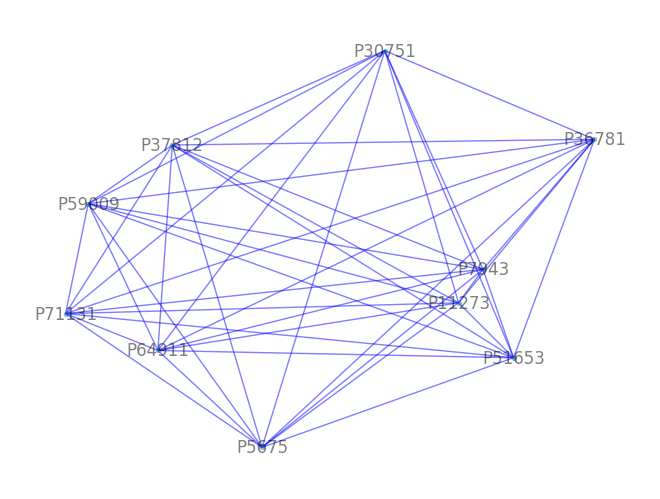

In [32]:
# Get subgraph of top 100 products (for example)
top_100_products = [product for product, _ in sorted(top_10_centrality, key=lambda x: x[1], reverse=True)[:100]]
subgraph = product_projection.subgraph(top_100_products)
pos = nx.spring_layout(subgraph, k=0.15, iterations=20)
nx.draw(subgraph, pos, with_labels=True,labels={node: node for node in subgraph.nodes()} , node_size=10, alpha=0.5, edge_color='b', linewidths=0.5)


In [ ]:
import random

# Sample 5000 users randomly
sample_size = 5000
sample_users = random.sample(list(product_projection.nodes()), sample_size)
user_subgraph = product_projection.subgraph(sample_users).copy()

print(f"Sampled Graph - Nodes: {user_subgraph.number_of_nodes()}, Edges: {user_subgraph.number_of_edges()}")


Sampled Graph - Nodes: 5000, Edges: 54413


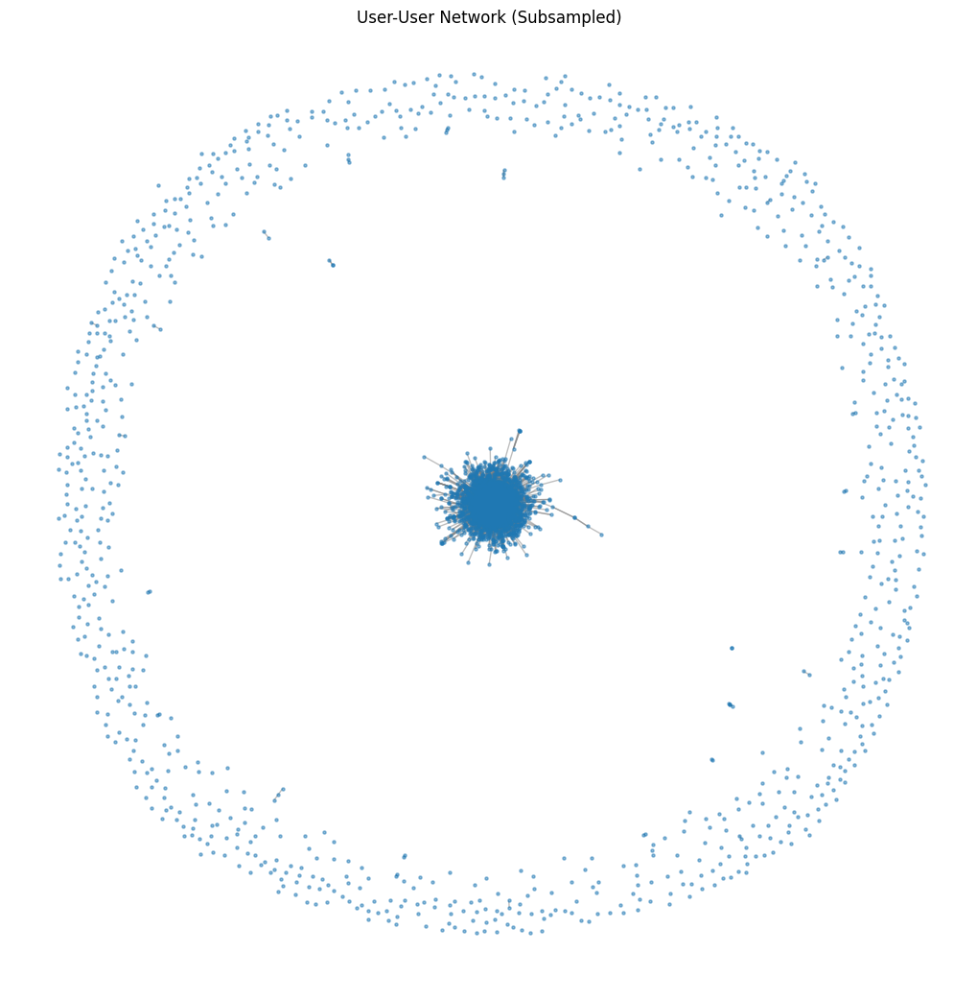

In [ ]:
import random

subgraph_nodes1 = random.sample(list(product_projection.nodes()), 5000)  # Sample 1000 users
subgraph1 = product_projection.subgraph(subgraph_nodes1)
plt.figure(figsize=(10, 10))
nx.draw(subgraph1, node_size=5, edge_color="gray", alpha=0.5)
plt.title("User-User Network (Subsampled)")
plt.show()

**BLOCK 7: Let's look at how to execute Island Method on original G large, 2 node dataset. The Steps below we decided to use the original G bipartite graph were the weights was the Score column of rating values from  1 - 5. Here we used a different method to reduce the threshold based on the weight value which didn't seem like the most efficient way to reduce the graph but showing the process below.**

In [35]:

len(df)
list(G.nodes(data=True))[:5]
list(G.edges(data=True))[:5]


[('U1', 'P1', {'weight': 5.0}),
 ('U2', 'P2', {'weight': 1.0}),
 ('U3', 'P3', {'weight': 4.0}),
 ('U3', 'P41581', {'weight': 4.0}),
 ('U3', 'P60979', {'weight': 5.0})]

In [37]:
import networkx.algorithms.bipartite as bi
bi.is_bipartite(G)

True

**We tried the island method below using score column as the weight, however, this was not a good approach since the ratings were 1-5, the best we can reduce it to is large subgraphs which doesn't help us**

In [38]:
def island_method(G, min_weight, step):
    islands = []
    max_weight = max([d['weight'] for u, v, d in G.edges(data=True)])
    for threshold in range(min_weight, int(max_weight) + 1, step):
        # Create a subgraph with edges above the threshold
        subgraph = nx.Graph()
        for u, v, d in G.edges(data=True):
            if d['weight'] >= threshold:
                subgraph.add_edge(u, v, **d)
                subgraph.nodes[u]['bipartite'] = G.nodes[u]['bipartite']
                subgraph.nodes[v]['bipartite'] = G.nodes[v]['bipartite']
        islands.append((threshold, subgraph))
    return islands

# Apply the island method
islands = island_method(G, 1, 1)  # Ensure step is not zero

print('min weight - ', '# of nodes - ', '# of island subgraphs')
for i in islands:
    # Print the threshold level, size of the graph, and number of connected components
    print(i[0], '     -     ', len(i[1]), '     -     ', len(list(nx.connected_components(i[1]))))



min weight -  # of nodes -  # of island subgraphs
1      -      330317      -      22078
2      -      302401      -      21450
3      -      289384      -      21431
4      -      273237      -      21560
5      -      240219      -      21799


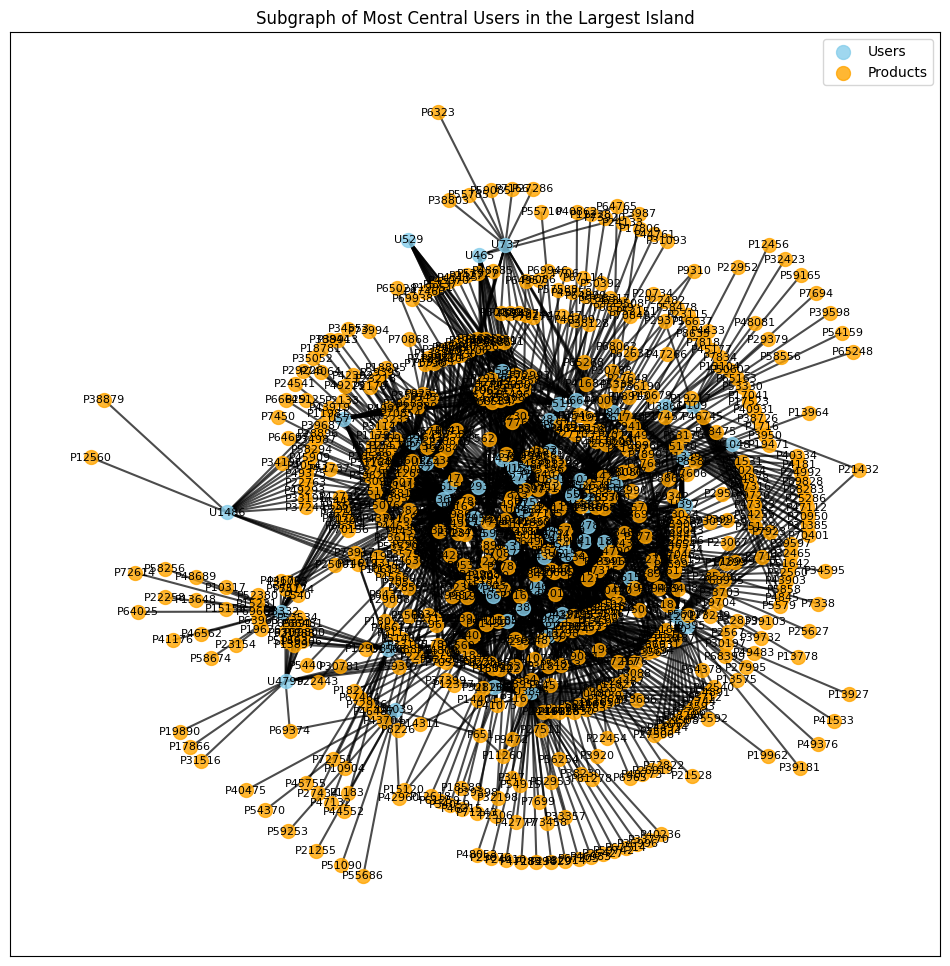

In [41]:
# Function to filter out isolated nodes
def filter_connected_nodes(G):
    connected_nodes = set()
    for component in nx.connected_components(G):
        if len(component) > 1:
            connected_nodes.update(component)
    return G.subgraph(connected_nodes)

largest_island = max(islands, key=lambda x: len(x[1]))

# Calculate degree centrality for the nodes in the largest island subgraph
degree_centrality = nx.degree_centrality(largest_island[1])

# Select the top N most central users
N = 1000  
most_central_users = sorted(degree_centrality, key=degree_centrality.get, reverse=True)[:N]

central_subgraph = largest_island[1].subgraph(most_central_users)

# Filter out isolated nodes
central_subgraph = filter_connected_nodes(central_subgraph)

user_nodes = [node for node in central_subgraph.nodes() if central_subgraph.nodes[node].get('bipartite') == 0]
product_nodes = [node for node in central_subgraph.nodes() if central_subgraph.nodes[node].get('bipartite') == 1]


plt.figure(figsize=(12, 12))
pos = nx.kamada_kawai_layout(central_subgraph)  

# Draw user nodes
nx.draw_networkx_nodes(central_subgraph, pos, nodelist=user_nodes, node_color='skyblue', node_size=100, alpha=0.8, label='Users')
# Draw product nodes
nx.draw_networkx_nodes(central_subgraph, pos, nodelist=product_nodes, node_color='orange', node_size=100, alpha=0.8, label='Products')
# Draw edges
nx.draw_networkx_edges(central_subgraph, pos, edge_color='black', width=1.5, alpha=0.7)


nx.draw_networkx_labels(central_subgraph, pos, font_size=8, font_color='black')

plt.title("Subgraph of Most Central Users in the Largest Island")
plt.legend()
plt.show()

**BLOCK8:  ANALYSE USING ISLAND METHOD IN THE BOOK**

**The method we used below is to group create a weight column and use this as an edge, for the weight we counted products rated by each user and used this calculated # as the weight for the edge instead of the score. The reason we thought was the method earlier above we used the Score column which we were not able to reduce effectively since the score was 1-5 values only**

**For example, The weight for u4 is 3, because they have rated 3 products and this value is attached to the row where there is P4/U4 combination. Then we apply the island_method function from Chapter 4, which uses iterations and the min and max weight to split the graph into multiple levels by the water line weight value of the threshold. We used 10  iterations and used water line 100 to split the population.**

**U368 is the most influential user that has weight of 442 rated products across the product inventory. Then we printed another graph where the water line weight was 176 that had 2 island subgraphs as part of the iteration.**



In [46]:
dfcopy = df.copy()

# count of products rated by each user
dfcopy['weight'] = dfcopy.groupby('userID')['productID'].transform('count')


In [47]:
dfcopy.head(10)

,productID,userID,profileName,helpfulness,score,time,summary,text,weight
0,P1,U1,delmartian,1/1,5.0,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...,1
1,P2,U2,dll pa,0/0,1.0,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...,1
2,P3,U3,"Natalia Corres ""Natalia Corres""",1/1,4.0,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...,3
3,P4,U4,Karl,3/3,2.0,1307923200,Cough Medicine,If you are looking for the secret ingredient i...,3
4,P5,U5,"Michael D. Bigham ""M. Wassir""",0/0,5.0,1350777600,Great taffy,Great taffy at a great price. There was a wid...,2
5,P5,U6,Twoapennything,0/0,4.0,1342051200,Nice Taffy,I got a wild hair for taffy and ordered this f...,1
6,P5,U7,David C. Sullivan,0/0,5.0,1340150400,Great! Just as good as the expensive brands!,This saltwater taffy had great flavors and was...,2
7,P5,U8,Pamela G. Williams,0/0,5.0,1336003200,"Wonderful, tasty taffy",This taffy is so good. It is very soft and ch...,1
8,P6,U9,R. James,1/1,5.0,1322006400,Yay Barley,Right now I'm mostly just sprouting this so my...,2
9,P7,U10,Carol A. Reed,0/0,5.0,1351209600,Healthy Dog Food,This is a very healthy dog food. Good for thei...,4


In [45]:
# Create the bipartite graph
import networkx as nx
B = nx.Graph()
B.add_nodes_from(dfcopy['userID'], bipartite=0)
B.add_nodes_from(dfcopy['productID'], bipartite=1)

# Add edges with weight and score attributes
for _, row in dfcopy.iterrows():
    B.add_edge(row['userID'], row['productID'], weight=row['weight'], score=row['score'])

# Print basic information about the bipartite graph
print(f"Number of nodes: {B.number_of_nodes()}")
print(f"Number of edges: {B.number_of_edges()}")

Number of nodes: 330317
Number of edges: 560804


In [48]:
from networkx.algorithms import bipartite as bi
list(B.nodes(data=True))[:3]
list(B.nodes(data=True))[-2:]


[('P74257', {'bipartite': 1}), ('P74258', {'bipartite': 1})]

In [49]:
bi.is_bipartite(B)

True

In [50]:
def trim_edges(g, weight=1): 
    g2=nx.Graph()  
    list=[]
    list1=[]
    for f, to, edata in g.edges(data=True): 
        if edata['weight'] > weight:
            list.append(f)
            list1.append(to)
            g2.add_edge(f,to,attr_dict={weight:edata['weight']})
    g2.add_nodes_from(list, bipartite=0)
    g2.add_nodes_from(list1, bipartite=1)
    return g2

def island_method(g, iterations=5, weight=1):
    weights = [edata['weight'] for f, to, edata in g.edges(data=True)]
    mn=int(min(weights)) if int(min(weights)) > weight else weight
    mx=int(max(weights))
    #compute the size of the step, so we get a reasonable step in iterations
    step=int((mx-mn)/(iterations-1))
    return [[threshold, trim_edges(g, threshold)] for threshold in range(mn,mx,step)]

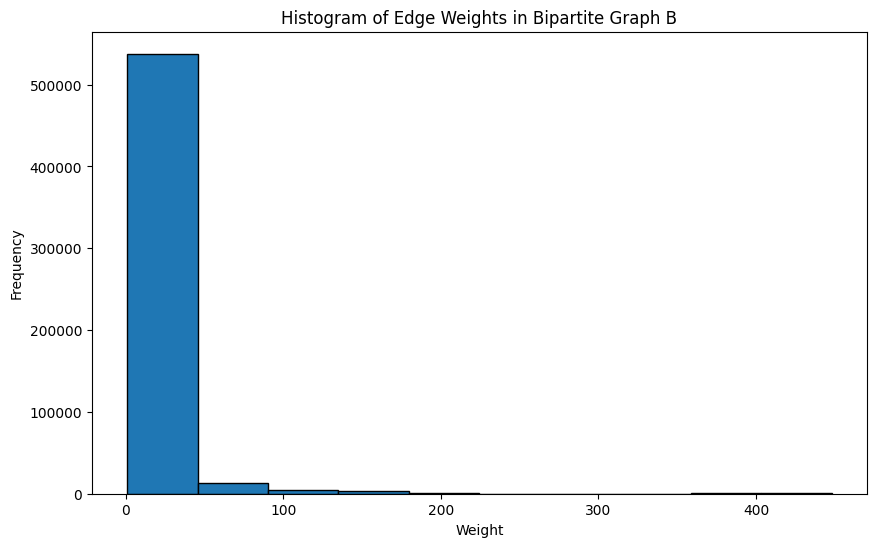

In [51]:
import matplotlib.pyplot as plt

# Extract the weights of the edges
weights = [edata['weight'] for _, _, edata in B.edges(data=True)]

# Plot the histogram of the weights
plt.figure(figsize=(10, 6))
plt.hist(weights, bins=10, edgecolor='black')
plt.title('Histogram of Edge Weights in Bipartite Graph B')
plt.xlabel('Weight')
plt.ylabel('Frequency')
plt.show()

In [52]:
islands = island_method(B, 10, 100)
print('min weight - ', '# of nodes - ', '# of island subgraphs')
for i in islands:
    # print the threshold level, size of the graph, and number of connected components
    print(i[0], '     -     ', len(i[1]), '     -     ', len(list(nx.connected_components(i[1]))))

min weight -  # of nodes -  # of island subgraphs
100      -      6216      -      1
138      -      3981      -      2
176      -      1969      -      2
214      -      1602      -      1
252      -      1602      -      1
290      -      1376      -      1
328      -      1376      -      1
366      -      1108      -      1
404      -      730      -      1
442      -      421      -      1


In [53]:
def set_colors(G):
    colors = []
    for node, data in G.nodes(data=True):
        if data['bipartite'] == 1: 
            colors.append('Pink') # Products in Pink  
        else:
            colors.append('cornflowerblue')  # Users in Blue
    return colors

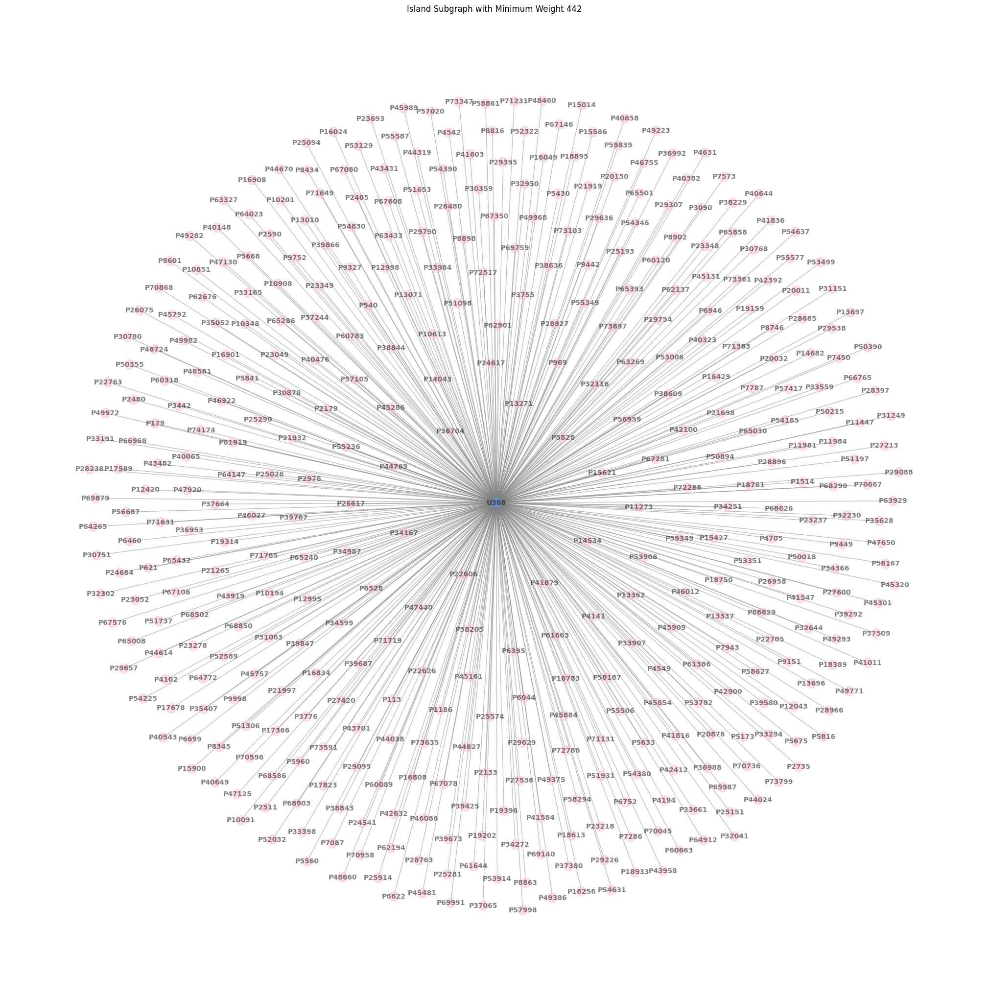

In [54]:
# Identify the island with minimum weight of 442
island_100 = next((i for i in islands if i[0] == 442), None)

if island_100:
    # Set plot parameters
    plt.rcParams["figure.figsize"] = (20, 20)  
    colors = set_colors(island_100[1])
    # Visualize the island with minimum weight of 100
    pos = nx.spring_layout(island_100[1], k=0.1, iterations=50)
    nx.draw(island_100[1], pos, with_labels=True, node_color=colors, node_size=200, font_size=10, font_weight='bold', edge_color="gray", alpha=0.5)
    plt.title(f"Island Subgraph with Minimum Weight {island_100[0]}")
    plt.show()
else:
    print("No island found with the specified minimum weight of 100.")

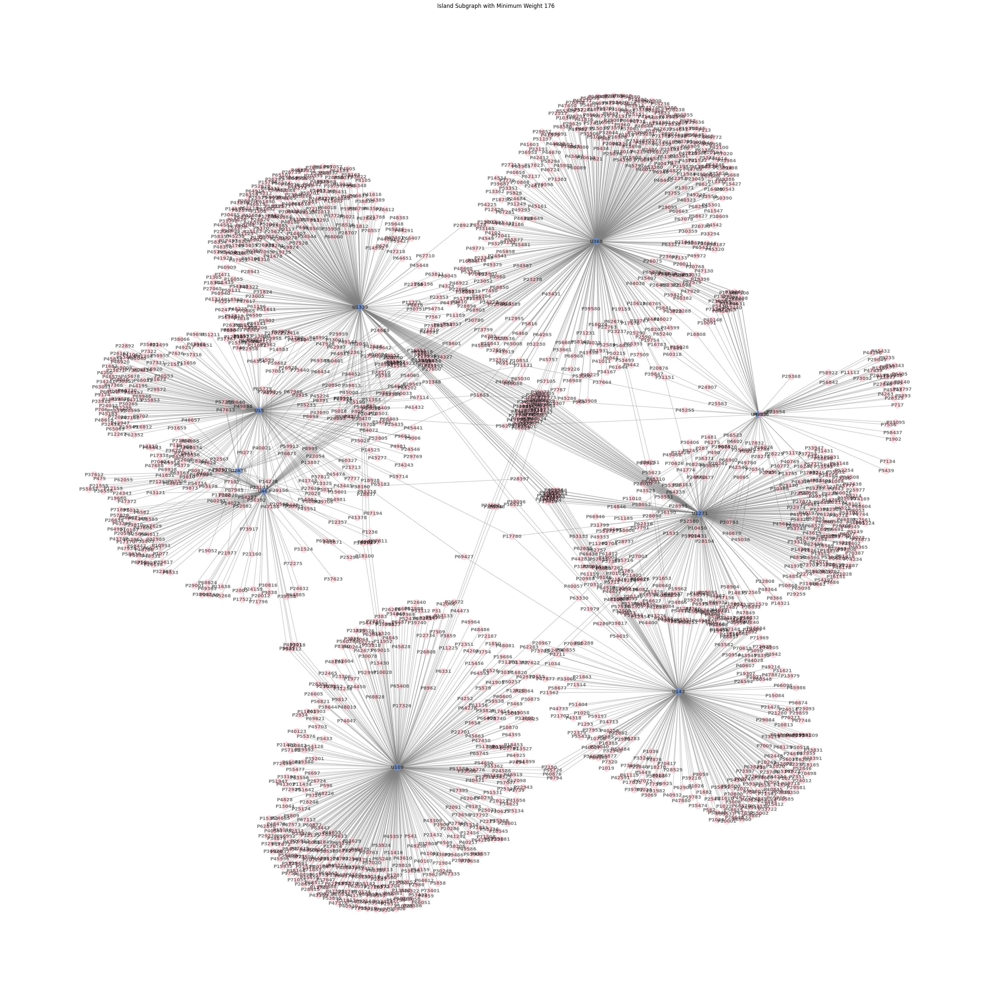

In [57]:
# Identify the island with minimum weight of 176
island_100 = next((i for i in islands if i[0] == 176), None)

if island_100:
    # Set plot parameters
    plt.rcParams["figure.figsize"] = (30,30)  # Set plot size
    colors = set_colors(island_100[1])
   
    pos = nx.spring_layout(island_100[1], k=0.1, iterations=50)
    nx.draw(island_100[1], pos, with_labels=True, node_color=colors, node_size=200, font_size=10, font_weight='bold', edge_color="gray", alpha=0.5)
    plt.title(f"Island Subgraph with Minimum Weight {island_100[0]}")
    plt.show()
else:
    print("No island found with the specified minimum weight of 100.")

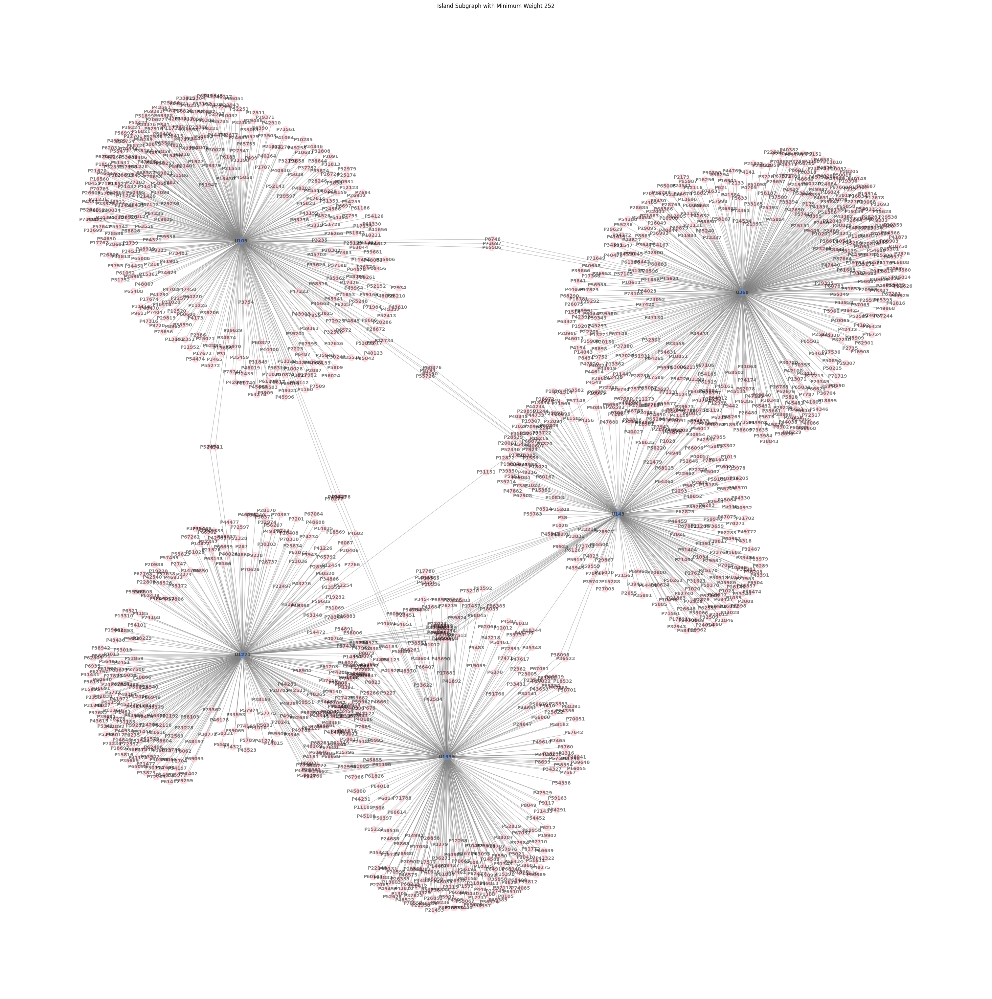

In [58]:
# Identify the island with minimum weight of 252
island_100 = next((i for i in islands if i[0] == 252), None)

if island_100:
    # Set plot parameters
    plt.rcParams["figure.figsize"] = (30,30)  # Set plot size
 
    colors = set_colors(island_100[1])
    pos = nx.spring_layout(island_100[1], k=0.1, iterations=50)
    nx.draw(island_100[1], pos, with_labels=True, node_color=colors, node_size=200, font_size=10, font_weight='bold', edge_color="gray", alpha=0.5)
    plt.title(f"Island Subgraph with Minimum Weight {island_100[0]}")
    plt.show()
else:
    print("No island found with the specified minimum weight of 100.")

**BLOCK9:  Repeat the same process for the product projected graph as well. In this graph we display the water line at weight water line on 305. This graph contains 376 nodes and 83 connected components. Additionally, the edges on the product projection show the number of common users who have rated both products.When we set to 305, the resulting subgraph contains only the strongest connections between products, at least 305 users are connected by edges in this subgraph.**

**Looking at U109 who has several products that he has rated, we can further analyze in the future as he is influential in the network and whether his ratings if they are high and others are rating those products high as well or there are differences that are significantly different.**


In [59]:
# Create the product-projected graph
product_nodes = dfcopy['productID'].unique()
product_projected_graph = bi.weighted_projected_graph(B, product_nodes)

In [60]:
# Apply the island method to the product-projected graph
islands = island_method(product_projected_graph, iterations=5, weight=1)

In [61]:
print('min weight - ', '# of nodes - ', '# of island subgraphs')
for i in islands:
    print(i[0], '     -     ', len(i[1]), '     -     ', len(list(nx.connected_components(i[1]))))


min weight -  # of nodes -  # of island subgraphs
1      -      12617      -      1902
153      -      376      -      83
305      -      99      -      24
457      -      29      -      8


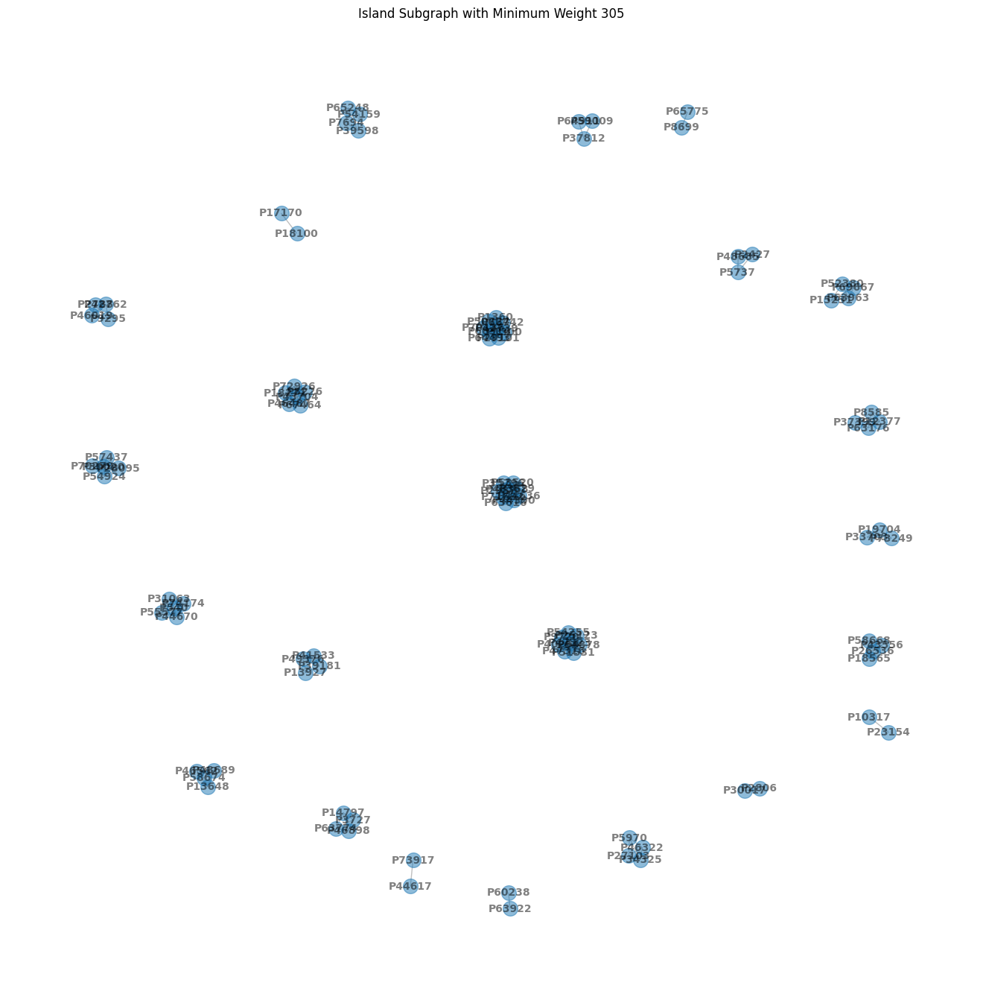

In [68]:
# Identify the island with minimum weight of 305
island_200 = next((i for i in islands if i[0] == 305), None)

if island_200:
    # Set plot parameters
    plt.rcParams["figure.figsize"] = (13,13)  # Set plot size

    pos = nx.spring_layout(island_200[1], k=0.1, iterations=50)
    nx.draw(island_200[1], pos, with_labels=True, node_size=200, font_size=10, font_weight='bold', edge_color="gray", alpha=0.5)
    plt.title(f"Island Subgraph with Minimum Weight {island_200[0]}")
    plt.show()
else:
    print("No island found with the specified minimum weight of 100.")

In [70]:

# Function to view all rows that match a specific userID and productID combination
def view_rows(user_id): #, product_id):
    matching_rows = dfcopy[(dfcopy['userID'] == user_id)] #& (dfcopy['productID'] == product_id)]
    return matching_rows

user_id_to_view = 'U109'
#product_id_to_view = 'P27103'
matching_rows = view_rows(user_id_to_view) #, product_id_to_view)

matching_rows.count()


productID      389
userID         389
profileName    389
helpfulness    389
score          389
time           389
summary        389
text           389
weight         389
dtype: int64